<a href="https://colab.research.google.com/github/PaulToronto/NYC---Taxi-and-Limousine-Commission/blob/main/TLC_Taxi_Zones.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TLC Taxi Zones

## Imports

In [1]:
!pip install contextily

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

import gdown

import contextily as cx

from pyproj import Transformer

import rasterio as rio
from rasterio.plot import show as rioshow

## Functions

In [3]:
get_data_url = lambda id: rf'https://drive.google.com/uc?id={id}'
gdown_download = lambda id, file_name: gdown.download(get_data_url(id), file_name, quiet=False)

## Taxi Zone Lookup Dataset

In [4]:
id='1uq2DC9ZhRNx-_4Fsm4bUgv4dS_ZWoJTv'
file_name = 'taxi_zone_lookup.csv'
gdown_download(id, file_name)

taxi_zone_lookup = pd.read_csv(file_name)

Downloading...
From: https://drive.google.com/uc?id=1uq2DC9ZhRNx-_4Fsm4bUgv4dS_ZWoJTv
To: /content/taxi_zone_lookup.csv
100%|██████████| 12.3k/12.3k [00:00<00:00, 22.3MB/s]


In [5]:
taxi_zone_lookup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   LocationID    265 non-null    int64 
 1   Borough       264 non-null    object
 2   Zone          264 non-null    object
 3   service_zone  263 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.4+ KB


In [6]:
taxi_zone_lookup[taxi_zone_lookup['service_zone'].isnull()]

,LocationID,Borough,Zone,service_zone
263,264,Unknown,NaN,NaN
264,265,NaN,Outside of NYC,NaN


In [7]:
len(taxi_zone_lookup['service_zone'].unique()), taxi_zone_lookup['service_zone'].unique()

(5, array(['EWR', 'Boro Zone', 'Yellow Zone', 'Airports', nan], dtype=object))

In [8]:
len(taxi_zone_lookup['Zone'].unique()), taxi_zone_lookup['Zone'].unique()

(262,
 array(['Newark Airport', 'Jamaica Bay', 'Allerton/Pelham Gardens',
        'Alphabet City', 'Arden Heights', 'Arrochar/Fort Wadsworth',
        'Astoria', 'Astoria Park', 'Auburndale', 'Baisley Park',
        'Bath Beach', 'Battery Park', 'Battery Park City', 'Bay Ridge',
        'Bay Terrace/Fort Totten', 'Bayside', 'Bedford', 'Bedford Park',
        'Bellerose', 'Belmont', 'Bensonhurst East', 'Bensonhurst West',
        'Bloomfield/Emerson Hill', 'Bloomingdale', 'Boerum Hill',
        'Borough Park', 'Breezy Point/Fort Tilden/Riis Beach',
        'Briarwood/Jamaica Hills', 'Brighton Beach', 'Broad Channel',
        'Bronx Park', 'Bronxdale', 'Brooklyn Heights',
        'Brooklyn Navy Yard', 'Brownsville', 'Bushwick North',
        'Bushwick South', 'Cambria Heights', 'Canarsie', 'Carroll Gardens',
        'Central Harlem', 'Central Harlem North', 'Central Park',
        'Charleston/Tottenville', 'Chinatown', 'City Island',
        'Claremont/Bathgate', 'Clinton East', 'Clinton

In [9]:
len(taxi_zone_lookup['Borough'].unique()), taxi_zone_lookup['Borough'].unique()

(8,
 array(['EWR', 'Queens', 'Bronx', 'Manhattan', 'Staten Island', 'Brooklyn',
        'Unknown', nan], dtype=object))

## Taxi Zone Geometry

In [10]:
id='1fGdhMuUlq3ZdGlBt8I4w5kIeXiovIBzS'
file_name = 'taxi_zones.zip'
gdown_download(id, file_name)

taxi_zones = gpd.read_file(file_name)

Downloading...
From: https://drive.google.com/uc?id=1fGdhMuUlq3ZdGlBt8I4w5kIeXiovIBzS
To: /content/taxi_zones.zip
100%|██████████| 1.03M/1.03M [00:00<00:00, 10.4MB/s]


In [11]:
taxi_zones.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    263 non-null    int32   
 1   Shape_Leng  263 non-null    float64 
 2   Shape_Area  263 non-null    float64 
 3   zone        263 non-null    object  
 4   LocationID  263 non-null    int32   
 5   borough     263 non-null    object  
 6   geometry    263 non-null    geometry
dtypes: float64(2), geometry(1), int32(2), object(2)
memory usage: 12.5+ KB


In [12]:
taxi_zones.head(1)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."


In [13]:
len(taxi_zones['zone'].unique()), taxi_zones['zone'].unique()

(260,
 array(['Newark Airport', 'Jamaica Bay', 'Allerton/Pelham Gardens',
        'Alphabet City', 'Arden Heights', 'Arrochar/Fort Wadsworth',
        'Astoria', 'Astoria Park', 'Auburndale', 'Baisley Park',
        'Bath Beach', 'Battery Park', 'Battery Park City', 'Bay Ridge',
        'Bay Terrace/Fort Totten', 'Bayside', 'Bedford', 'Bedford Park',
        'Bellerose', 'Belmont', 'Bensonhurst East', 'Bensonhurst West',
        'Bloomfield/Emerson Hill', 'Bloomingdale', 'Boerum Hill',
        'Borough Park', 'Breezy Point/Fort Tilden/Riis Beach',
        'Briarwood/Jamaica Hills', 'Brighton Beach', 'Broad Channel',
        'Bronx Park', 'Bronxdale', 'Brooklyn Heights',
        'Brooklyn Navy Yard', 'Brownsville', 'Bushwick North',
        'Bushwick South', 'Cambria Heights', 'Canarsie', 'Carroll Gardens',
        'Central Harlem', 'Central Harlem North', 'Central Park',
        'Charleston/Tottenville', 'Chinatown', 'City Island',
        'Claremont/Bathgate', 'Clinton East', 'Clinton

In [14]:
len(taxi_zones['borough'].unique()), taxi_zones['borough'].unique()

(6,
 array(['EWR', 'Queens', 'Bronx', 'Manhattan', 'Staten Island', 'Brooklyn'],
       dtype=object))

### CRS

In [15]:
taxi_zones.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### Simple `add_basemap`

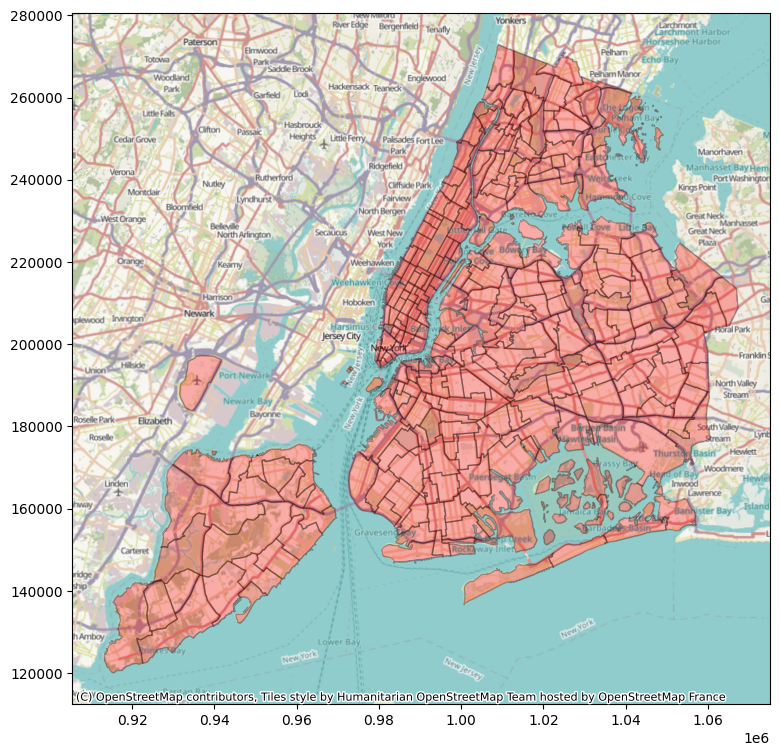

In [16]:
ax = taxi_zones.plot(color='red', edgecolor='black', alpha=0.3, figsize=(9, 9))
cx.add_basemap(ax, crs=taxi_zones.crs)

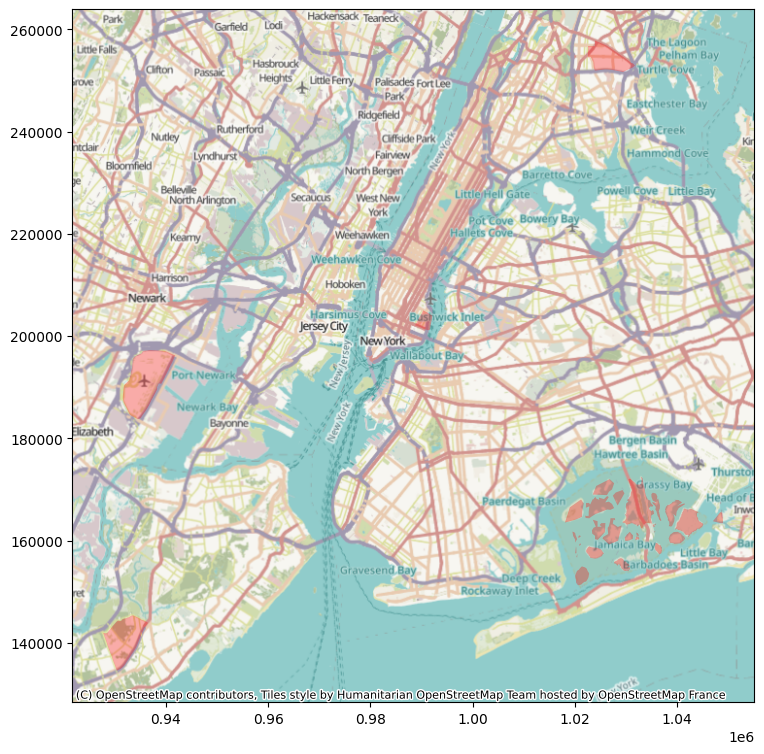

In [17]:
ax = taxi_zones.head().plot(color='red', alpha=0.3, figsize=(9, 9))
cx.add_basemap(ax, crs=taxi_zones.crs)

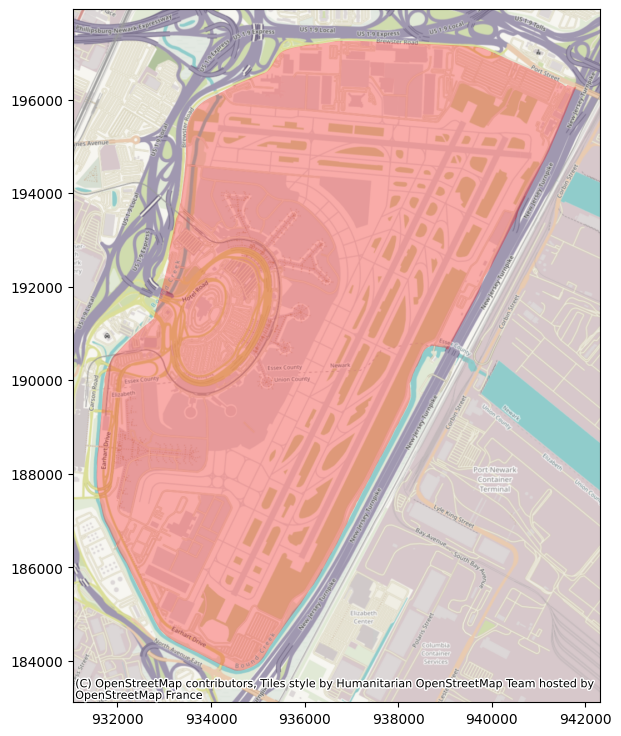

In [18]:
ax = taxi_zones.head(1).plot(color='red', alpha=0.3, figsize=(9, 9))
cx.add_basemap(ax, crs=taxi_zones.crs)

### Providers

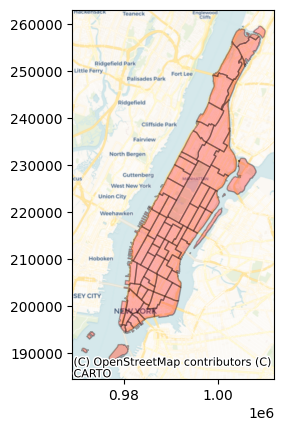

In [19]:
ax = taxi_zones.query('borough == "Manhattan"').plot(color='red',
                                                     alpha=0.3,
                                                     edgecolor='black')
cx.add_basemap(ax,
               crs=taxi_zones.crs,
               source=cx.providers.CartoDB.Voyager)

### Bounds

In [20]:
taxi_zones.bounds.min()

,0
minx,913175.109009
miny,120121.881254
maxx,927093.439518
maxy,142339.851827


In [21]:
taxi_zones.bounds.max()

,0
minx,1.059350e+06
miny,2.627176e+05
maxx,1.067383e+06
maxy,2.728443e+05


In [22]:
# west, south, east, north
w, s, _, _ = taxi_zones.bounds.min()
_, _, e, n = taxi_zones.bounds.max()

w, s, e, n

(913175.109008804, 120121.88125434518, 1067382.508405164, 272844.2940054685)

In [23]:
# could have used this
taxi_zones.total_bounds

array([ 913175.1090088 ,  120121.88125435, 1067382.50840516,
        272844.29400547])

In [24]:
transformer = Transformer.from_crs(taxi_zones.crs, 'EPSG:3857')
w, s, e, n = transformer.transform_bounds(w, s, e, n)
w, s, e, n

(-8266269.124830261, 4938282.473035961, -8204159.10611518, 4999895.860089847)

In [25]:
ny_img, ny_ext = cx.bounds2img(w, s, e, n, ll=False, source=cx.providers.CartoDB.Voyager)

In [26]:
ny_img.shape

(1024, 1024, 4)

In [27]:
ny_ext

(-8277212.918945165, -8198941.401981145, 4931105.568733288, 5009377.08569731)

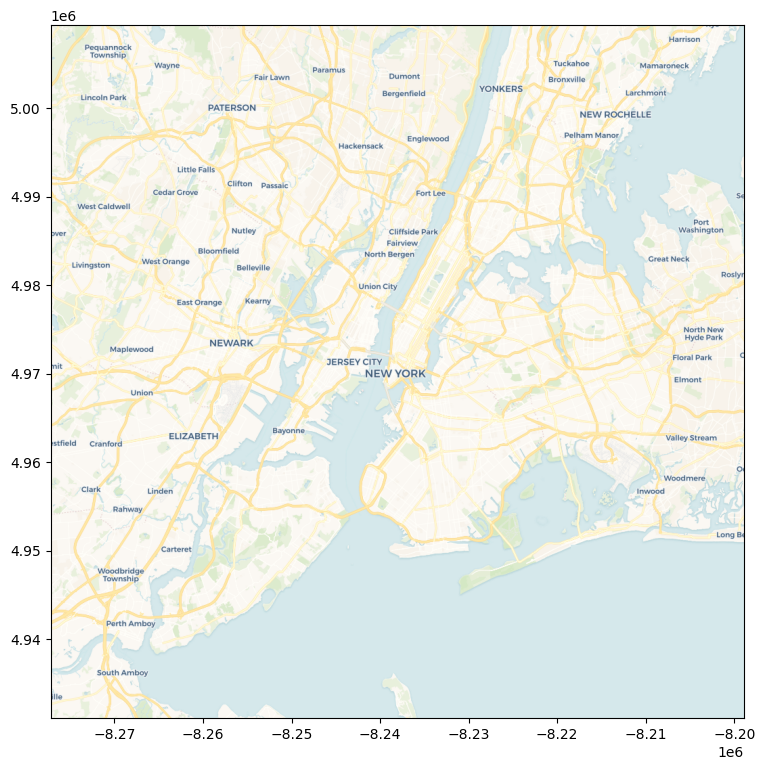

In [28]:
f, ax = plt.subplots(1, figsize=(9, 9))
ax.imshow(ny_img, extent=ny_ext);

### Place

In [29]:
ny = cx.Place('New York, NY', source=cx.providers.OpenStreetMap.Mapnik)
ny

Place : City of New York, New York, United States | n_tiles: 1 | zoom : 11 | im : (1024, 1024)

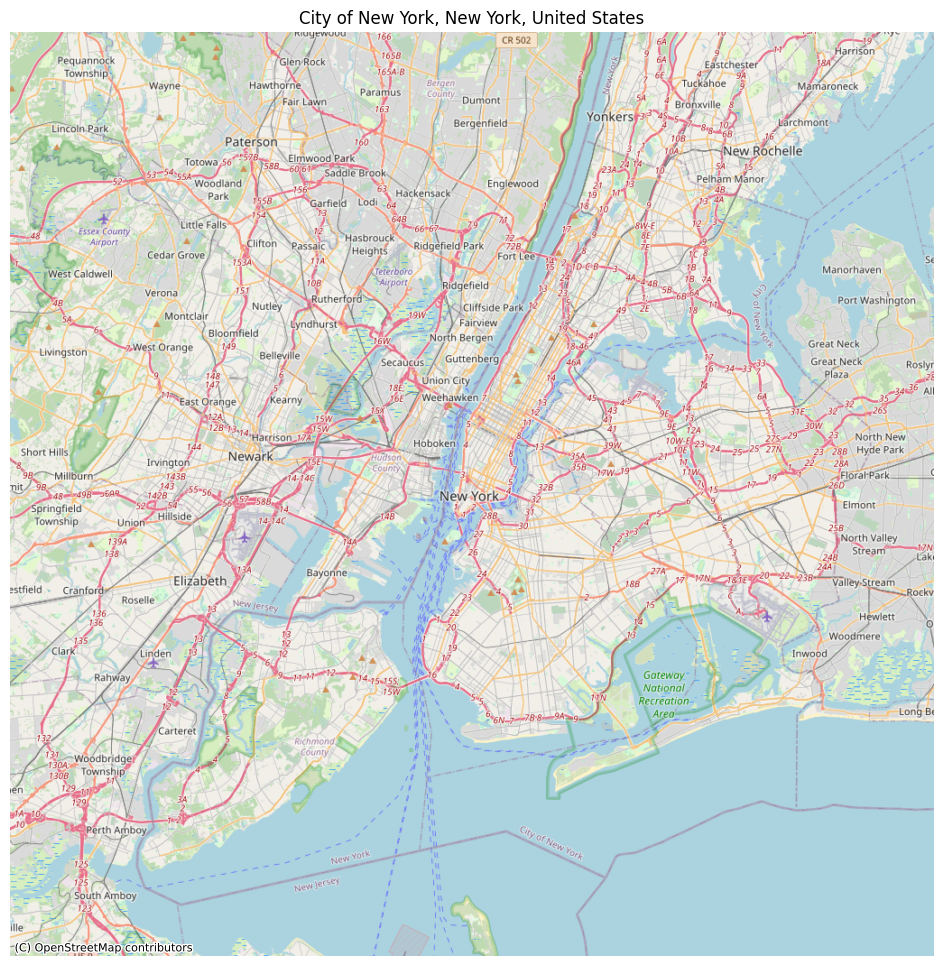

In [30]:
ny.plot();

### Storing basemaps locally

In [31]:
ny = cx.Place('New York, NY', source=cx.providers.OpenStreetMap.Mapnik, path='ny.tiff')

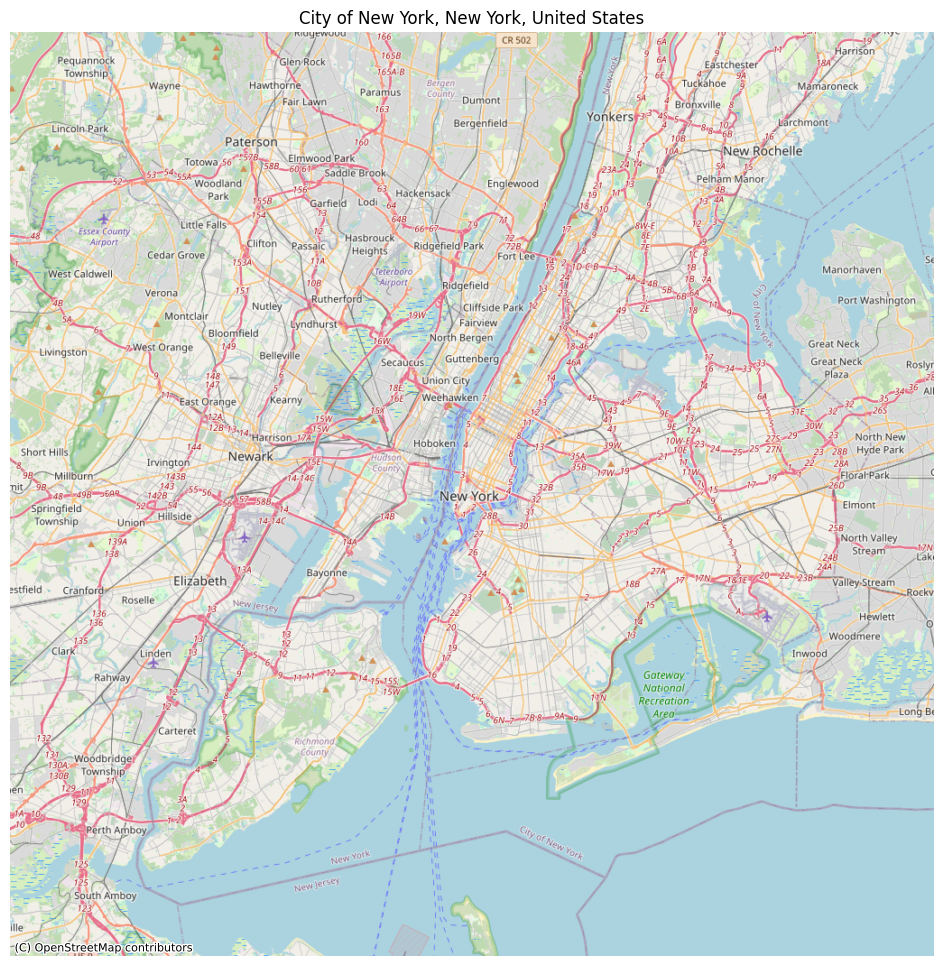

In [32]:
ny.plot();

EPSG:3857


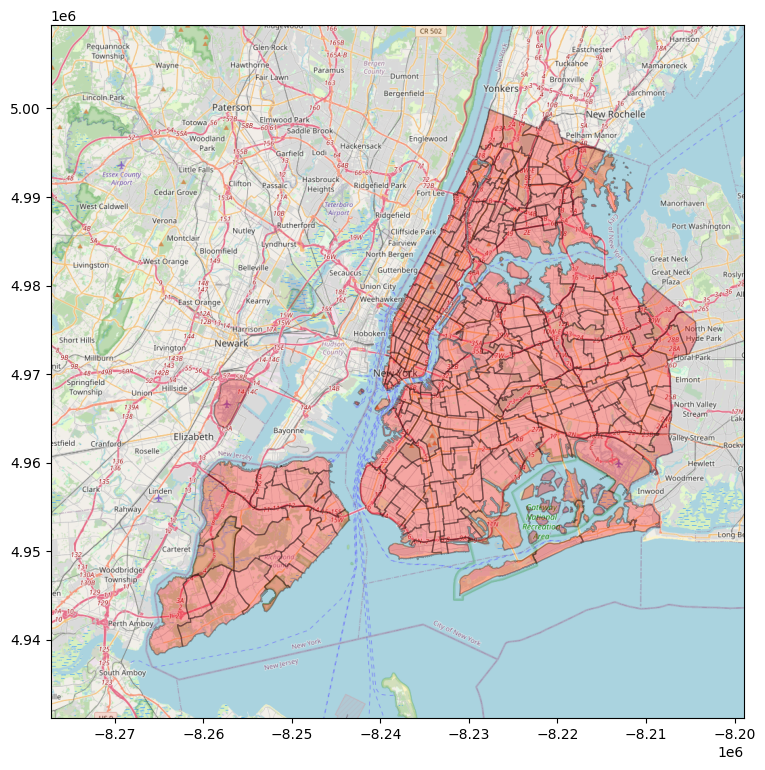

In [33]:
fig, ax = plt.subplots(1, figsize=(9, 9))

with rio.open('ny.tiff') as r:
    rioshow(r, ax=ax)

    if taxi_zones.crs != r.crs:
        taxi_zones2 = taxi_zones.to_crs(r.crs)


    taxi_zones2.plot(color='red',
                    edgecolor='black',
                    alpha=0.3, ax=ax)

    # set plot limits to match the raster extent
    ax.set_xlim(r.bounds.left, r.bounds.right)
    ax.set_ylim(r.bounds.bottom, r.bounds.top)
    print(r.crs)

plt.show()

In [34]:
taxi_zones.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US survey foot)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [35]:
taxi_zones2.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Plotting points defined by latitude and longitude on a contextily basemap

In [36]:
taxi_zones['centroid'] = taxi_zones['geometry'].centroid
taxi_zones2['centroid'] = taxi_zones2['geometry'].centroid
taxi_zones.head(1)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,centroid
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19...",POINT (935996.821 191376.75)


In [37]:
data = taxi_zones.head(1)

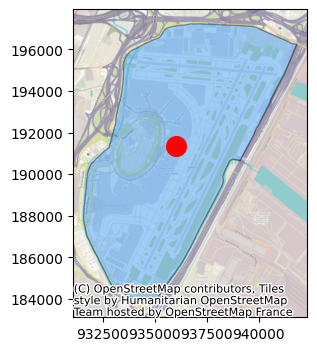

In [38]:
fig, ax = plt.subplots(figsize=(4, 4))

data.plot(color='dodgerblue', alpha=0.4, edgecolor='black', ax=ax)
ax.scatter(data['centroid'].x, data['centroid'].y, color='red', s=200);

cx.add_basemap(ax=ax, crs=taxi_zones.crs)

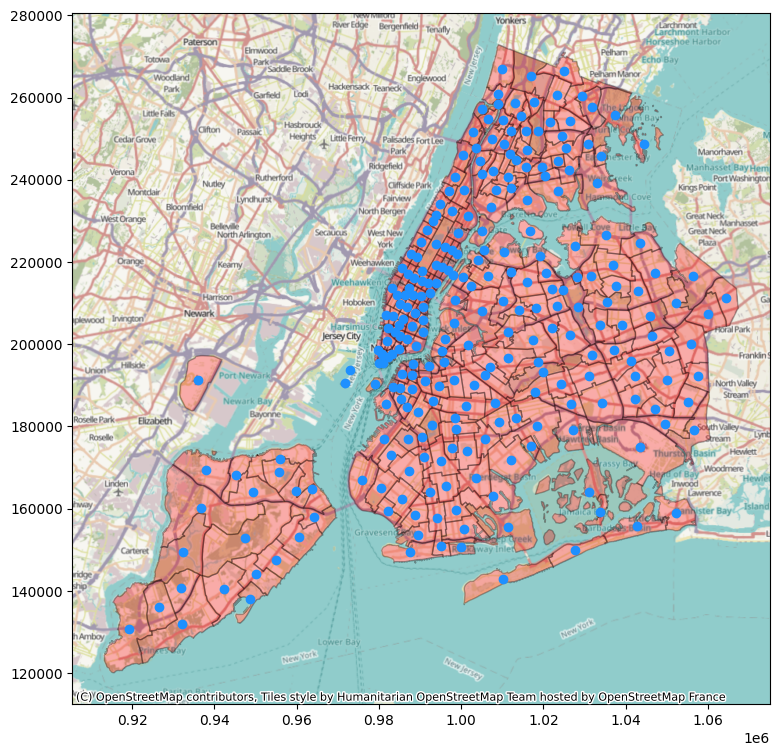

In [39]:
fig, ax = plt.subplots(figsize=(9, 9))

taxi_zones.plot(ax=ax, color='red', alpha=0.3, edgecolor='black')
taxi_zones['centroid'].plot(ax=ax, color='dodgerblue')
cx.add_basemap(ax, crs=taxi_zones.crs)

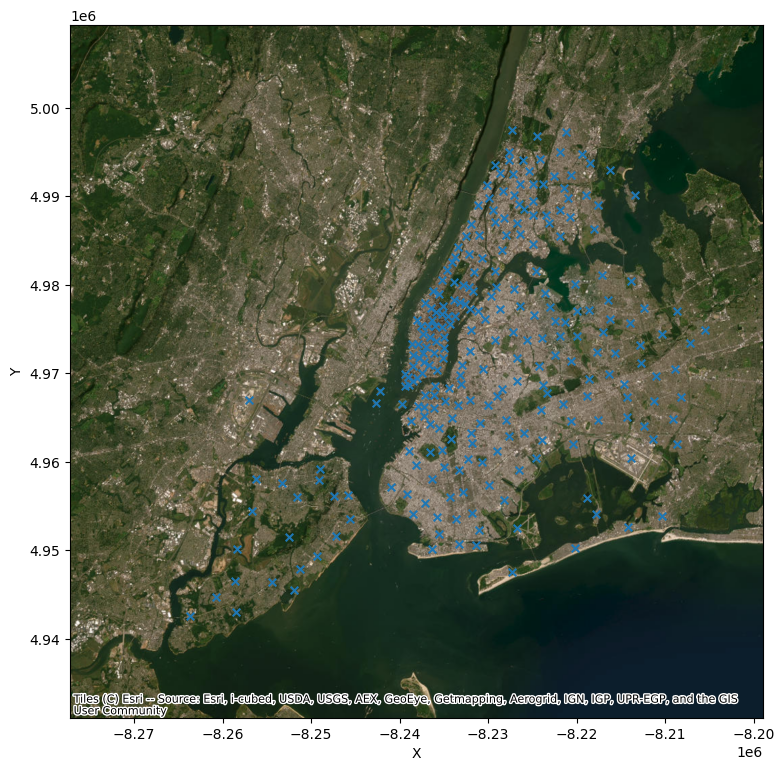

In [40]:
ny = cx.Place('New York, NY',
              source=cx.providers.Esri.WorldImagery)

fig, ax = plt.subplots(figsize=(9, 9), dpi=100)

ny.plot(ax=ax)
ax.scatter(x=taxi_zones2['centroid'].x, y=taxi_zones2['centroid'].y, s=30, marker='x');

### Transparent Layers

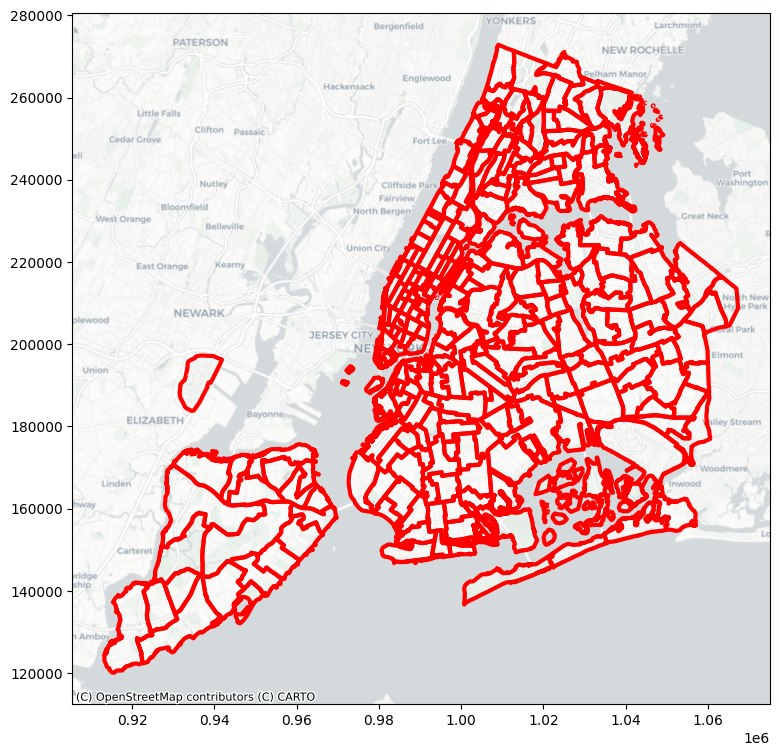

In [41]:
ax = taxi_zones.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=taxi_zones.crs, source=cx.providers.CartoDB.Positron)

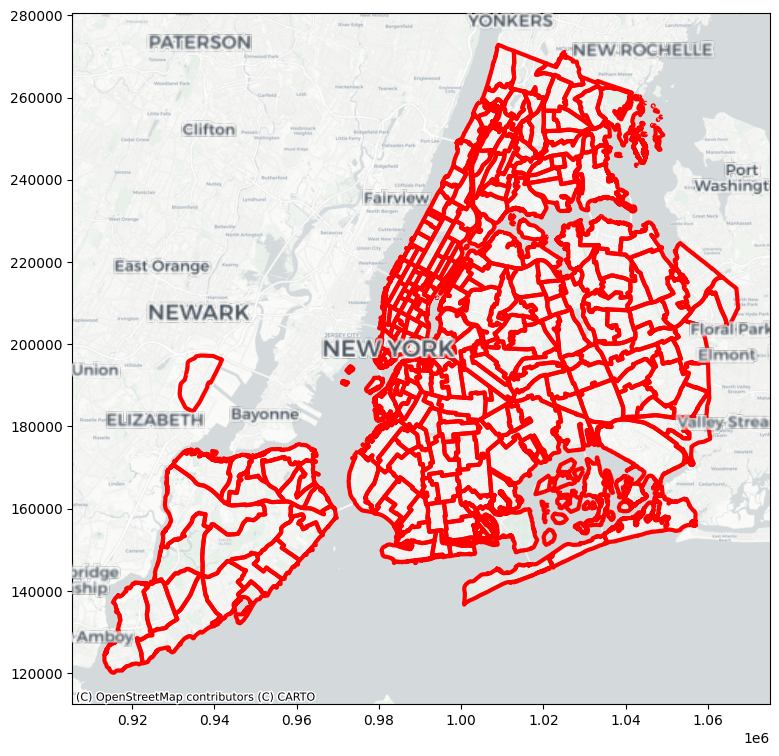

In [42]:
# this only works if the tile provider makes partially transparent
#. labels available
ax = taxi_zones.plot(figsize=(9, 9), color='none', edgecolor='r', linewidth=3)
cx.add_basemap(ax, crs=taxi_zones.crs, source=cx.providers.CartoDB.Positron, zoom=12)
# optionally you can use different zoom levels for the layers
cx.add_basemap(ax, crs=taxi_zones.crs, source=cx.providers.CartoDB.PositronOnlyLabels, zoom=10)

## Contextily Place Object